In [ ]:
import os
import sys
import types
import warnings
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import rt1plotpy
import scipy.sparse as sparse

%load_ext autoreload
%autoreload 2
%matplotlib inline

import zray
import gpoloidal
import gpoloidal.kernel as gp_kernel
import gpoloidal.plot_utils as gp_plot
import gpoloidal.rt1 as gp_rt1
import gpoloidal.tomography as gp_tomo

# Legacy helper aliases (replacing debug_init.py)
plt_subplots = gp_plot.plt_subplots
imshow_cbar = gp_plot.imshow_cbar
Length_scale_sq = gp_rt1.phantom.Length_scale_sq

def plt_rt1_flux(Kernel, ax=None, **kwargs):
    return Kernel.plt_rt1_flux(ax=ax, **kwargs)

# ---------------------------------------------------------------------
# Compatibility layer: emulate a small subset of the old rt1kernel API
# using gpoloidal + zray so the rest of this notebook can stay readable.
# ---------------------------------------------------------------------
_CURRENT_KERNEL = None
_OBS_H_CACHE = {}

class _LegacyKernel2DScatter(gp_rt1.Kernel2D_scatter_rt1):
    def __init__(self, *args, **kwargs):
        kwargs.pop('dxf_file', None)
        kwargs.pop('show_print', None)
        super().__init__()

    @property
    def rI(self):
        return self.r_idc

    @property
    def zI(self):
        return self.z_idc

    @property
    def Lsq_I(self):
        return self.ls_sq_idc

    @property
    def rIb(self):
        if hasattr(self, 'r_idcb'):
            return self.r_idcb
        return np.concatenate([self.r_idc, self.r_bd])

    @property
    def zIb(self):
        if hasattr(self, 'z_idcb'):
            return self.z_idcb
        return np.concatenate([self.z_idc, self.z_bd])

    def load_point(self, *args, **kwargs):
        out = super().load_point(*args, **kwargs)
        # gpoloidal currently stores the callable as length_scale_func.
        # Older notebooks expect length_scale(...).
        self.length_scale = self.length_scale_func
        global _CURRENT_KERNEL
        _CURRENT_KERNEL = self
        return out

    def set_grid_interface(self, *args, **kwargs):
        self.length_scale = self.length_scale_func
        return super().set_grid_interface(*args, **kwargs)

    def set_unifom_kernel(self, *args, **kwargs):
        kwargs.pop('bound_space', None)
        if 'mean_value' in kwargs and 'mean' not in kwargs:
            kwargs['mean'] = kwargs.pop('mean_value')
        return super().set_unifom_kernel(*args, **kwargs)

    def set_kernel(self, *args, **kwargs):
        kwargs.pop('bound_space', None)
        if 'length_scale' in kwargs and 'length_scale_factor' not in kwargs:
            kwargs['length_scale_factor'] = kwargs.pop('length_scale')
        if 'mean_value' in kwargs and 'mean' not in kwargs:
            kwargs['mean'] = kwargs.pop('mean_value')
        return super().set_kernel(*args, **kwargs)

    def set_flux_kernel(self, *args, **kwargs):
        kwargs.pop('bound_space', None)
        if 'mean_value' in kwargs and 'mean' not in kwargs:
            kwargs['mean'] = kwargs.pop('mean_value')
        return super().set_flux_kernel(*args, **kwargs)


class _LegacyRayProxy:
    def __init__(self, ray):
        self._ray = ray
        # Old notebook sometimes inspects ray.R0 (not present in zray.Ray).
        try:
            r, z = ray.generate_rz(Lnum=2)
            self.R0 = (r[:, 0], z[:, 0])
        except Exception:
            self.R0 = None

    def __getattr__(self, name):
        return getattr(self._ray, name)


class _LegacyObsH:
    def __init__(self, ray, H):
        self.ray = _LegacyRayProxy(ray)
        self.H = np.asarray(H)
        self.shape = tuple(ray.Length.im_shape)

    def projection(self, f, reshape=True):
        g = self.H @ f
        return g.reshape(self.shape) if reshape else g


class _LegacyObservation:
    def __init__(self, path=None):
        self.requested_path = path
        self.model_path = self._resolve_model_path(path)
        self.raymodel = zray.Raytracing.load_setting(str(self.model_path))
        self.Hs = []
        self.shape = tuple(self.raymodel.measurement.resolution)
        self.mask = np.zeros(self.shape, dtype=bool)

    def _resolve_model_path(self, path):
        candidates = []
        if path:
            p = Path(path)
            if p.exists() and p.suffix.lower() == '.json':
                candidates.append(p)
            if p.exists() and p.suffix.lower() == '.pkl':
                candidates.append(p.with_suffix('.json'))

        candidates += [
            Path('model.json'),
            Path('example/rt1tomography/model.json'),
        ]

        for cand in candidates:
            if cand.exists():
                if path and cand.resolve() != Path(path).resolve():
                    warnings.warn(
                        f'Observation model file {path!r} not found; using {cand.as_posix()}',
                        stacklevel=2,
                    )
                return cand
        raise FileNotFoundError(
            'No zray model.json found. Place one at model.json or example/rt1tomography/model.json.'
        )

    def set_directon(self):
        # Keep legacy misspelled API name.
        return self

    def set_mask(self):
        # Old mask semantics depend on historical Observation_Matrix class.
        # For zray-based replacement we start with all-valid pixels.
        self.mask = np.zeros(self.shape, dtype=bool)
        return self

    def set_Hsum(self, nmax_ref=0, Lnum=101, method='weighting'):
        global _CURRENT_KERNEL, _OBS_H_CACHE
        if _CURRENT_KERNEL is None:
            raise RuntimeError('Initialize/load RT1_kernel before Observation matrix construction.')

        self.raymodel.main(nreflections=nmax_ref, pass_through_first=True)
        rays = list(self.raymodel.rays[: nmax_ref + 1])
        if not rays:
            raise RuntimeError('No rays were generated by zray Raytracing.main().')

        if method == 'weighting':
            build_H = _CURRENT_KERNEL.create_obs_matrix_kernel_weighting
        elif method == 'interpolation':
            build_H = _CURRENT_KERNEL.create_obs_matrix_kernel_interpolation
        else:
            raise ValueError(f'Unknown method: {method}')

        cache_key = (str(self.model_path.resolve()), int(nmax_ref), int(Lnum), str(method), int(_CURRENT_KERNEL.nI))
        H_list = _OBS_H_CACHE.get(cache_key)
        if H_list is None:
            H_list = [np.asarray(build_H(ray=ray, Lnum=Lnum)) for ray in rays]
            _OBS_H_CACHE[cache_key] = H_list
        self.Hs = [_LegacyObsH(ray=ray, H=H) for ray, H in zip(rays, H_list)]
        self.H_sum = np.sum([h.H for h in self.Hs], axis=0)
        self.shape = self.Hs[0].shape
        if self.mask.shape != self.shape:
            self.mask = np.zeros(self.shape, dtype=bool)

        self.rI = _CURRENT_KERNEL.rI
        self.zI = _CURRENT_KERNEL.zI
        return self

    def projection(self, f, reshape=True):
        if not hasattr(self, 'H_sum'):
            self.set_Hsum(nmax_ref=0)
        g = self.H_sum @ f
        return g.reshape(self.shape) if reshape else g


class _LegacyGPTLin:
    def __init__(self, Obs, Kernel):
        self.Obs = Obs
        self.Kernel = Kernel
        self.nI = Kernel.nI
        self.mask = Obs.mask
        self.ng = (~self.mask).sum()

    def set_prior(self, K, f_pri=0, eps=1e-6):
        K = np.asarray(K, dtype=float) + eps * np.eye(self.nI)
        self.K_inv = np.linalg.inv(K)
        self.f_pri = np.full(self.nI, f_pri, dtype=float) if np.isscalar(f_pri) else np.asarray(f_pri, dtype=float)

    def set_sig(self, sig_array=None, sig_im=None, g_obs=None, sig_scale=1.0, num=0):
        if sig_im is None:
            sig_im = sig_array
        if not self.Obs.Hs:
            self.Obs.set_Hsum(nmax_ref=0)

        self.mask = self.Obs.mask
        self.g_obs = np.asarray(g_obs).reshape(self.Obs.shape)
        sigma = np.asarray(sig_im).reshape(self.Obs.shape)[~self.mask]
        y = self.g_obs[~self.mask]
        H = self.Obs.Hs[num].H[~self.mask.flatten(), :]

        self.sig_scale = sig_scale
        self.sig_inv = 1.0 / sigma
        self.Sigi_obs = self.sig_inv * y
        self.sigiH = sparse.diags(self.sig_inv) @ H
        self.Hsig2iH = self.sigiH.T @ self.sigiH
        if sparse.issparse(self.Hsig2iH):
            self.Hsig2iH = self.Hsig2iH.toarray()

    def calc_core(self, sig_scale=None):
        if sig_scale is not None:
            self.sig_scale = sig_scale
        A = self.Hsig2iH / self.sig_scale**2 + self.K_inv
        self.K_pos = np.linalg.inv(A)
        rhs = (self.sigiH.T @ (self.Sigi_obs - self.sigiH @ self.f_pri)) / self.sig_scale**2
        self.mu_f_pos = self.f_pri + self.K_pos @ rhs
        self.sigf_pos = np.sqrt(np.diag(self.K_pos))
        return self.mu_f_pos, self.K_pos

    def check_diff(self, f):
        # Optional diagnostic (not fully ported)
        return None


class _LegacyGPTLog:
    def __init__(self, Obs, Kernel, H_diff=None):
        self.Obs = Obs
        self.Kernel = Kernel
        self.H_diff = H_diff
        self.nI = Kernel.nI
        self.sig_scale = 1.0
        self._inner = None

    def set_kernel(self, K, f_pri=0, eps=1e-6):
        self._K = np.asarray(K, dtype=float)
        self._f_pri = np.full(self.nI, f_pri, dtype=float) if np.isscalar(f_pri) else np.asarray(f_pri, dtype=float)
        self._eps = eps

    def _build_inner(self, H):
        self._inner = gp_tomo.GPT_log_general(H=H, Kf_pri=self._K, muf_pri=self._f_pri, eps=self._eps)

    def _sync_attrs(self):
        if self._inner is None:
            return
        for name in ['Kf_pos', 'sigf_pos', 'f_mean', 'mll', 'loss_g', 'loss_f']:
            if hasattr(self._inner, name):
                setattr(self, name, getattr(self._inner, name))

    def set_sig(self, sig_im=None, g_obs=None, sig_array=None, sig_scale=1.0, num=0, out_scaling=False):
        if sig_im is None:
            sig_im = sig_array
        if not self.Obs.Hs:
            self.Obs.set_Hsum(nmax_ref=0)

        self.mask = self.Obs.mask
        self.g_obs = np.asarray(g_obs).reshape(self.Obs.shape)
        sigma = np.asarray(sig_im).reshape(self.Obs.shape)[~self.mask]
        y = self.g_obs[~self.mask]
        H = (self.Obs.H_sum if hasattr(self.Obs, 'H_sum') else self.Obs.Hs[num].H)[~self.mask.flatten(), :]

        self._build_inner(H)
        self._inner.set_obs(g_obs=y, obs_noise_profile=sigma, normalize=out_scaling, obs_noise_level=sig_scale)
        self.sig_scale = sig_scale
        self._sync_attrs()

    def calc_core_fast(self, f):
        delta_f, loss = self._inner.update(f, obs_noise_level=self.sig_scale)
        self._sync_attrs()
        return delta_f, loss

    def postprocess(self, f):
        self._inner.sig_scale = self.sig_scale
        self._inner.postprocess(f)
        self._sync_attrs()

    def check_diff(self, f):
        # Optional diagnostic (not fully ported)
        return None


rt1kernel = types.SimpleNamespace(
    path=str(Path('.').resolve()),
    Kernel2D_scatter=_LegacyKernel2DScatter,
    Observation_Matrix_integral_load_model=lambda path=None: _LegacyObservation(path=path),
    GibbsKer=gp_kernel.GibbsKer,
    tomography=types.SimpleNamespace(
        GPT_lin=_LegacyGPTLin,
        GPT_log=_LegacyGPTLog,
    ),
)

# Kept only for compatibility with old notebooks. This notebook no longer depends on it.
rt1raytrace = types.SimpleNamespace()





In [ ]:
RT1_kernel = rt1kernel.Kernel2D_scatter(show_print=False)
RT1_kernel.load_point(
    **np.load('example/rt1tomography/point_temp.npz'),
    length_sq_fuction=Length_scale_sq,
    is_plot=True,
)

rI,zI = RT1_kernel.rI,RT1_kernel.zI
nI    = RT1_kernel.nI
Lsq_I = RT1_kernel.Lsq_I



In [13]:
r_medium = np.linspace(0.05,1.05,150)
z_medium = np.linspace(-0.7,0.7,150)
r_plot   =np.linspace(0.05,1.05,500)
z_plot   =np.linspace(-0.7,0.7,500)

RT1_kernel.set_grid_interface( z_medium=z_medium,
                               r_medium=r_medium,
                               z_plot  =z_plot  ,
                               r_plot  =r_plot  ,add_bound=True) 


R_HD,Z_HD = np.meshgrid(r_plot,z_plot,indexing='xy')

Arcs  detection: 100%|██████████| 9/9 [00:02<00:00,  4.03it/s]


In [ ]:
Obs = rt1kernel.Observation_Matrix_integral_load_model(path='example/rt1tomography/model.json')
Obs.set_directon()

Obs.set_mask()

Obs.set_Hsum(nmax_ref=0)



In [16]:
Obs.Hs[0].ray.R0

array([[0.99999403, 0.99999336, 0.99999603, ..., 1.00000074, 1.0000016 ,
        0.99999741],
       [0.99999547, 0.99999469, 0.99999723, ..., 1.00000014, 0.99999928,
        1.000002  ],
       [0.99999941, 0.9999985 , 1.00000091, ..., 1.0000014 , 0.9999988 ,
        0.99999981],
       ...,
       [0.99999941, 0.9999985 , 1.00000091, ..., 1.0000014 , 0.9999988 ,
        0.99999981],
       [0.99999547, 0.99999469, 0.99999723, ..., 1.00000014, 0.99999928,
        1.000002  ],
       [0.99999403, 0.99999336, 0.99999603, ..., 1.00000074, 1.0000016 ,
        0.99999741]])

num of bound point is  461
Eigenvalue decomposition is recalculated


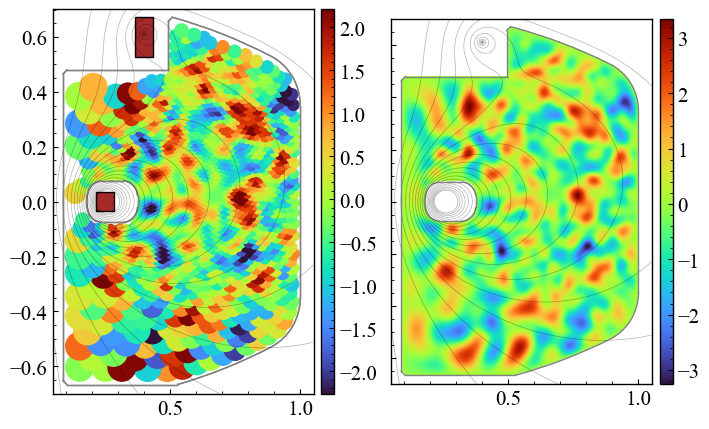

In [5]:
b = 0.
K,f_pri =RT1_kernel.set_unifom_kernel(length_scale=0.03,mean_value=0.,is_bound=True,bound_value=b,bound_sig=0.1,bound_space=10e-3,is_static_kernel=True)
f  = RT1_kernel.sampler()

fig0,ax=plt_subplots(1,2,figsize=(8,5),sharex=True,sharey=True)


RT1_kernel.plot_mosaic(ax[0][0],f,size=1,cmap='turbo')
plt_rt1_flux(RT1_kernel,ax[0][0],linewidths=0.5)

f,mask,im_kwargs = RT1_kernel.convert_grid(f,boundary=b)
imshow_cbar(ax[0][1],f*mask,**im_kwargs,cmap='turbo')
plt_rt1_flux(RT1_kernel,ax[0][1],linewidths=0.5)

num of bound point is  461
Eigenvalue decomposition is recalculated


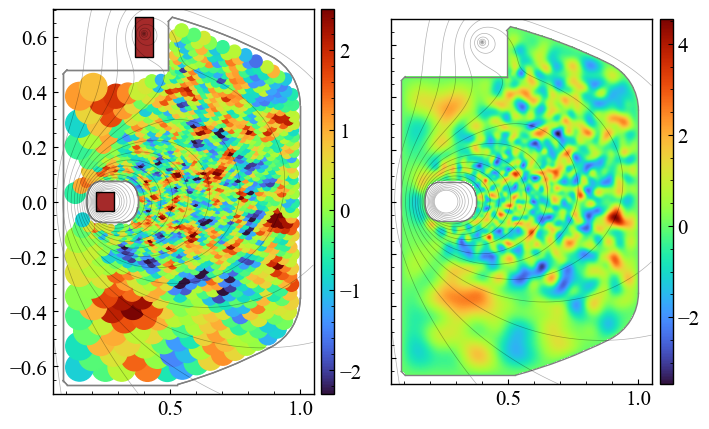

In [6]:
b = 0.  
K,f_pri =RT1_kernel.set_kernel(length_scale=1,is_bound=True,bound_value=b,bound_sig=0.1,bound_space=10e-3,is_static_kernel=True)
f  = RT1_kernel.sampler()

fig0,ax=plt_subplots(1,2,figsize=(8,5),sharex=True,sharey=True)

RT1_kernel.plot_mosaic(ax[0][0],f,size=1,cmap='turbo')
plt_rt1_flux(RT1_kernel,ax[0][0],linewidths=0.5)

f,mask,im_kwargs = RT1_kernel.convert_grid(f,boundary=b)
imshow_cbar(ax[0][1],f*mask,**im_kwargs,cmap='turbo')
plt_rt1_flux(RT1_kernel,ax[0][1],linewidths=0.5)

num of bound point is  461
Eigenvalue decomposition is recalculated


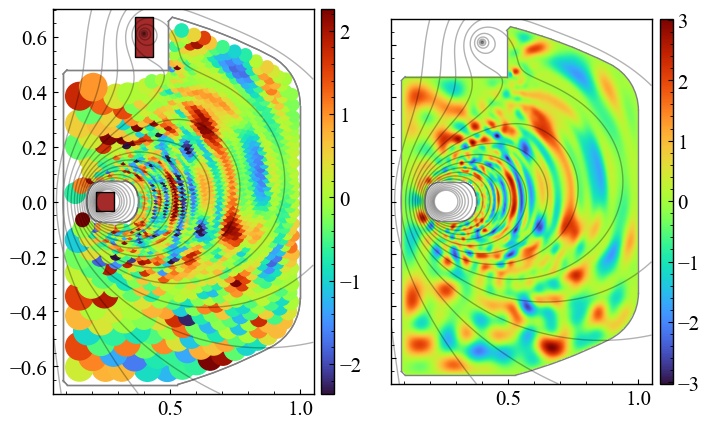

In [7]:
b = 0.
K,f_pri =RT1_kernel.set_flux_kernel(psi_scale=0.1,B_scale=0.1,is_bound=True,bound_value=b,bound_sig=0.1,bound_space=10e-3,is_static_kernel=True,separatrix=True)
f  = RT1_kernel.sampler()

fig0,ax=plt_subplots(1,2,figsize=(8,5),sharex=True,sharey=True)

RT1_kernel.plot_mosaic(ax[0][0],f,size=1,cmap='turbo')
plt_rt1_flux(RT1_kernel,ax[0][0],linewidths=1)

f,mask,im_kwargs = RT1_kernel.convert_grid(f,boundary=b)
imshow_cbar(ax[0][1],f*mask,**im_kwargs,cmap='turbo')
plt_rt1_flux(RT1_kernel,ax[0][1],linewidths=1)

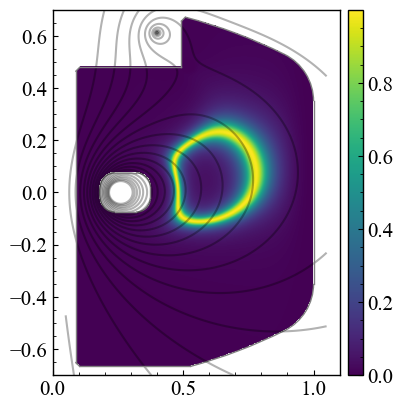

Text(0.5, 1.0, 'Z0 is 0.0 [m]')

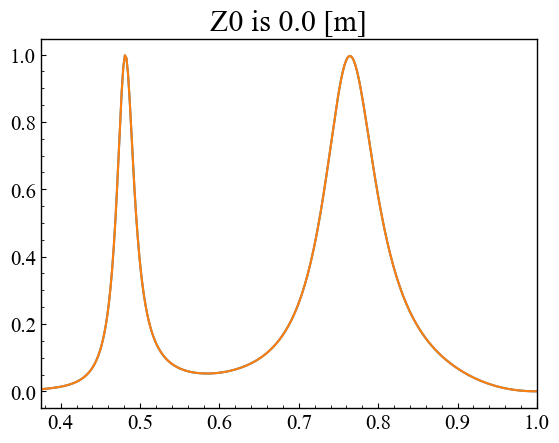

In [8]:

n0 = 2#25.99e16*0.8/2
a  = 1.348
b  = 0.5
rmax = 0.4577

def func_ring(r,z,n0=n0,a=a,b=b,rmax=rmax,radius=0.5,separatrix=True):
    psi = rt1plotpy.mag.psi(r,z,separatrix)
    br, bz = rt1plotpy.mag.bvec(r,z,separatrix)
    b_abs = np.sqrt(br**2+bz**2)
    psi_rmax = rt1plotpy.mag.psi(rmax,0,separatrix)
    psi0 = rt1plotpy.mag.psi(1,0,separatrix)
    b0 = rt1plotpy.mag.b0(r,z,separatrix)
    b2 = b_abs/b0
    if separatrix:
        rs,zs = r.flatten()[np.argmin(b_abs)],z.flatten()[np.argmin(b_abs)]
        fac = (1-np.exp(-50*((r-rs)**2+(z-zs)**2)))
    else:
        fac = 1


    f_gaussian = fac*n0 * np.exp(- (np.sqrt(((psi-psi_rmax)/psi0)**2+(1-b/b2)**2)-radius)**2*1/a**2)*(1-np.exp(-100*(r-1)**2))
    f_cauchy =  fac*n0 * a**2/( (np.sqrt(((psi-psi_rmax)/psi0)**2+(1-b/b2)**2)-radius)**2+a**2)*(1-np.exp(-100*(r-1)**2))
    return f_cauchy
    #return n0 *  (np.sqrt(((psi-psi_rmax)/psi0)**2+(1-1/b)**2)-0.5)*a / (a +   (np.sqrt(((psi-psi_rmax)/psi0)**2+(1-1/b)**2)-0.5)**2)*(1-np.exp(-100*(r-1)**2))


f_ring2_HD =func_ring(r=R_HD,z=Z_HD,n0=1,a=0.06,b=0.8,rmax=0.58,radius=0.42)
f_ring2 =   func_ring(r=rI,z=zI,    n0=1,a=0.06,b=0.8,rmax=0.58,radius=0.42)

#RT1_kernel.append_frame(ax)
fig0,ax = plt.subplots(figsize=(4,5))
ax.set(**rt1_ax_kwargs)
imshow_cbar(ax,f_ring2_HD**mask,**im_kwargs,vmin=0)

plt_rt1_flux(RT1_kernel,ax)
fig0.savefig('figures\\hollow_2D.svg')    


z0 = 0.
iz = np.argmin(abs(z_plot-z0))
plt.show()
plt.plot(r_plot,f_ring2_HD[iz,:])
plt.plot(r_plot,f_ring2_HD[iz,:])
plt.xlim(0.375,1)
plt.title('Z0 is '+str(z0)+' [m]')

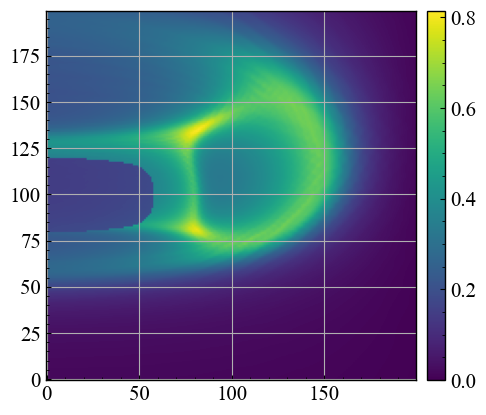

In [9]:
fig0,ax=plt.subplots()
imshow_cbar(ax,Obs.Hs[0].projection(f_ring2),vmin=0,origin='lower')
ax.grid()

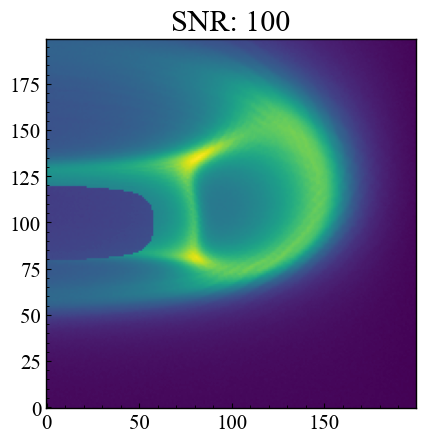

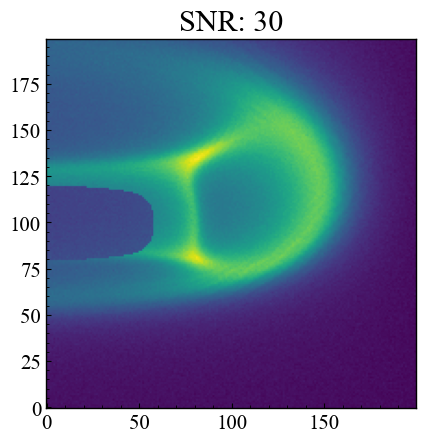

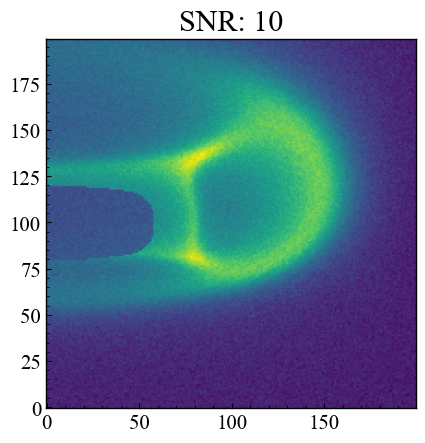

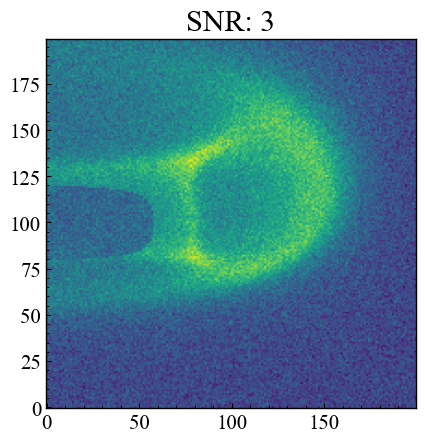

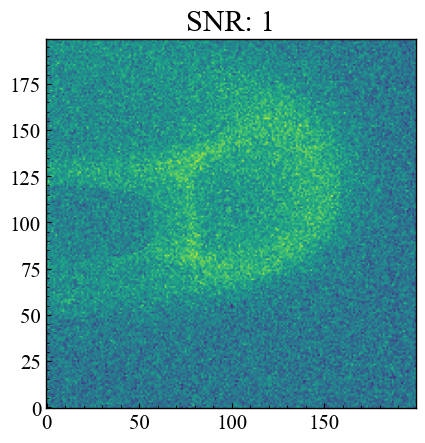

In [10]:
f_true = f_ring2

H = Obs.Hs[0].H
g_true = H@f_true
y_dic = {}
SN_list = [100,30,10,3,1]
np.random.seed(seed=0)
for SN in SN_list:
    y = g_true + 1/SN*g_true.mean()*np.random.randn(H.shape[0])# *(0.1+np.sqrt(g_true))
    y_dic[SN] = y
    y = y.reshape(200,200)
    plt.imshow(y,origin='lower')
    plt.title('SNR: '+str(SN))
    plt.show()

In [11]:
g_true.mean()/10

0.022059919540704152

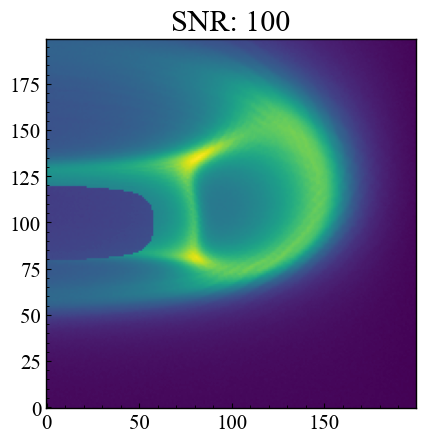

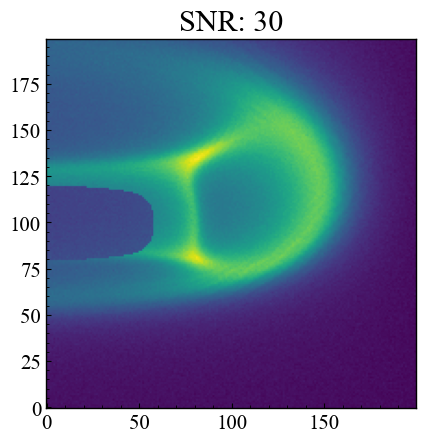

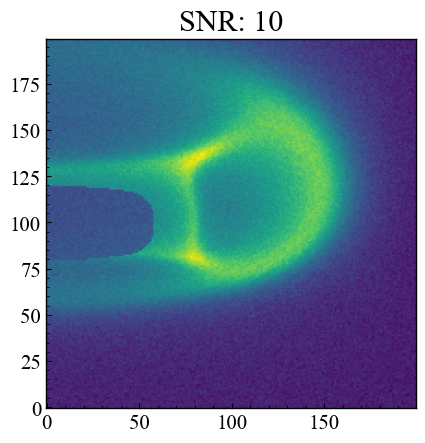

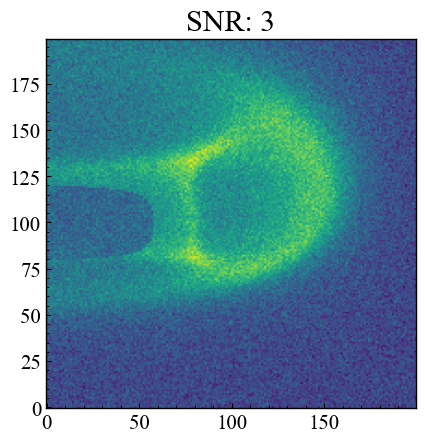

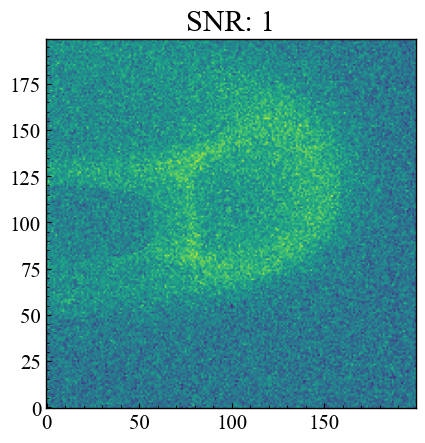

In [12]:
f_true = f_ring2

H = Obs.Hs[0].H
g_true = H@f_true

g_scale = g_true.mean()

g_true = g_true/g_scale 
f_true = f_ring2.copy()/g_scale

y_dic = {}
SN_list = [100,30,10,3,1]
np.random.seed(seed=0)
for SN in SN_list:
    y = g_true + 1/SN*np.random.randn(H.shape[0])#*(0.1+np.sqrt(g_true))
    y_dic[SN] = y
    y = y.reshape(200,200)
    plt.imshow(y,origin='lower')
    plt.title('SNR: '+str(SN))
    plt.show()

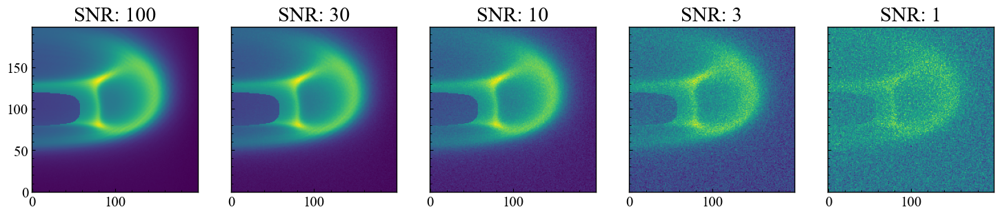

In [13]:

fig,axs  = plt_subplots(1,len(SN_list),  figsize=(18,4),sharex=True,sharey=True)

for i,SN in enumerate(SN_list):
    axs[0][i].imshow(y_dic[SN].reshape(200,200),origin='lower')
    axs[0][i].set_title('SNR: '+str(SN))

plt.savefig('figures\\g_hollow_list.svg')

In [14]:

def sort_r_f(r,f):
    hoge = [(r[i],f[i]) for i in range(r.size)  ]
    hoge.sort()
    r_est0 =[ a[0] for a in hoge ] 
    f_est0 =[ a[1] for a in hoge ] 
    return np.array(r_est0),np.array(f_est0)

aaaa

In [15]:

sigma_masked = np.ones(Obs.shape[:2])
sigma_masked[:,150:] = 1
#sigma_masked[:,:50] = 1e6
#sigma_masked[:25,:] = 1e6
#sigma_masked[175:,:] = 1e6
sigma_md_inv = 1/sigma_masked.flatten()

common_map = 'seismic'

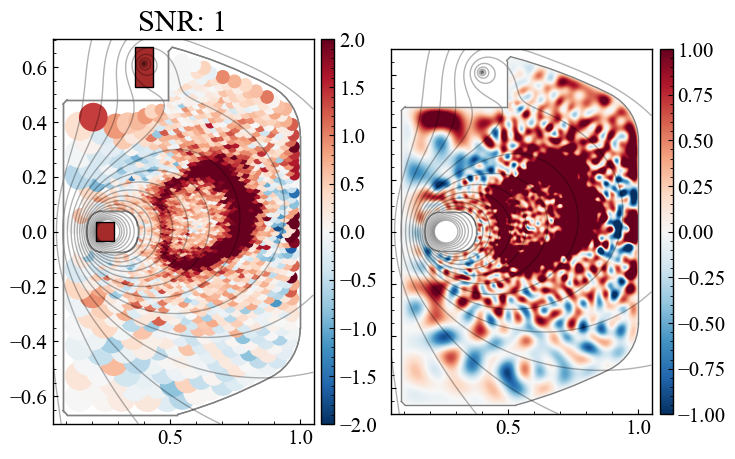

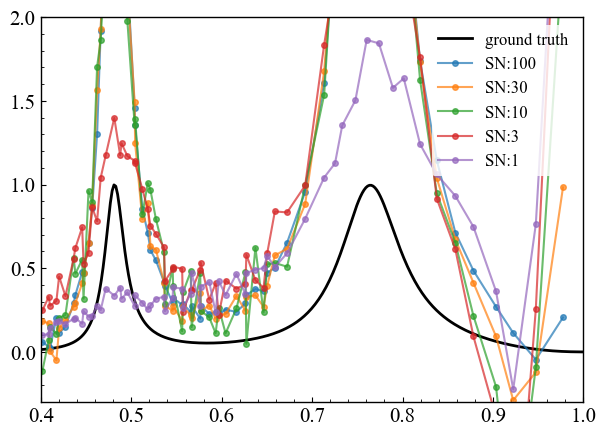

In [16]:

fig0,ax=plt_subplots(1,2,figsize=(8,5),sharex=True,sharey=True)

f_est = np.linalg.solve(H.T@sparse.diags(sigma_md_inv**2)@H  + 1*np.eye(nI), H.T@y_dic[SN])
RT1_kernel.plot_mosaic(ax[0][0],f_est,size=1,cmap='RdBu_r',vmax=2
,vmin=-2)
plt_rt1_flux(RT1_kernel,ax[0][0],linewidths=1)

f_hd,mask,im_kwargs = RT1_kernel.convert_grid(f_est,boundary=0)
imshow_cbar(ax[0][1],f_hd*mask,**im_kwargs,cmap='RdBu_r',vmax=1,vmin=-1)
plt_rt1_flux(RT1_kernel,ax[0][1],linewidths=1)
ax[0][0].set_title('SNR: '+str(SN))
plt.show()

fig0,ax = plt.subplots(figsize=(7,5))
ax.plot(r_plot,f_ring2_HD[iz,:],'k-',lw=2,label='ground truth')

flin_dic ={}

for SN in SN_list:
    f_est = np.linalg.solve(H.T@sparse.diags(sigma_md_inv**2)@H  + 10*1/SN**2*np.eye(nI), H.T@y_dic[SN])
    z0 = +0.
    iz = np.argmin(abs(z_plot-z0))
    #plt.plot(r_plot,f_hd[iz,:])
    around_z0 = (zI < z0+0.01)*(zI > z0-0.01)
    flin_dic[SN] = f_est
    


    r_0,f_est0 =sort_r_f(rI[around_z0],f_est[around_z0]) 

    ax.plot(r_0,f_est0,'o-',alpha=0.7,ms=4,label='SN:' +str(SN))


ax.set_xlim(0.4,1)
ax.set_ylim(-0.3,2)
legend = ax.legend(fontsize=12,frameon=1)
frame  = legend.get_frame()
frame.set_color('white')
frame.set_edgecolor('none')

In [17]:
g_scale

0.2205991954070415

100 -0.01104439836570545
30 -0.04827501217902327
10 -0.10520270203037327
3 -0.14442316547703882
1 -0.11719095005677685


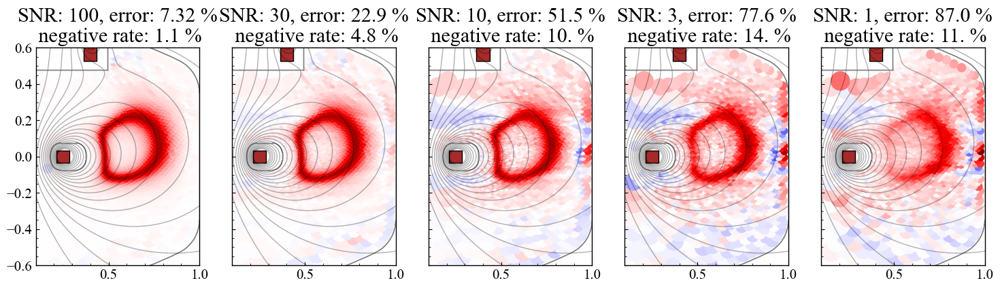

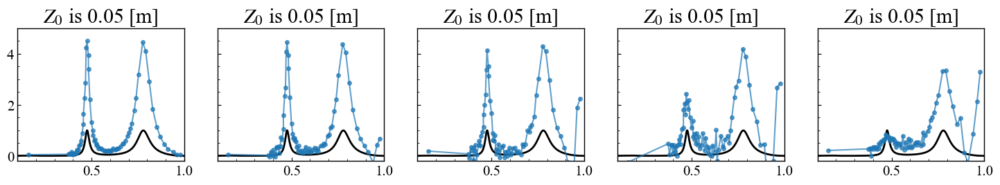

In [18]:
fig0,axs0  =   plt_subplots(1,len(SN_list),figsize=(18,5),sharex=True,sharey=True)
fig1,axs1  = plt_subplots(1,len(SN_list),  figsize=(18,2.5),sharex=True,sharey=True)

flin_dic ={}
for i,SN in enumerate(SN_list):
    f_est = np.linalg.solve(H.T@sparse.diags(sigma_md_inv**2)@H  + 3/SN**2*np.eye(nI), H.T@y_dic[SN])
    z0 = +0.05
    iz = np.argmin(abs(z_plot-z0))
    #plt.plot(r_plot,f_hd[iz,:])
    around_z0 = (zI < z0+0.01)*(zI > z0-0.01)

    flin_dic[SN] =f_est

    r_0,f_est0 =sort_r_f(rI[around_z0],f_est[around_z0]) 

    RT1_kernel.plot_mosaic(axs0[0][i],f_est,size=1,back_ground=0,cmap=common_map,vmax=5,vmin=-5,cbar=False)
    plt_rt1_flux(RT1_kernel,axs0[0][i],linewidths=1)

    axs1[0][i].plot(r_plot,f_ring2_HD[iz,:],'k-',lw=2,label='ground truth')
    axs1[0][i].plot(r_0,f_est0,'o-',alpha=0.7,ms=4,label='SN:' +str(SN))
    
    error = np.sum(abs(f_est-f_true)*Lsq_I) / np.sum(f_true*Lsq_I)
    #error = np.sqrt(np.sum(abs(f_est-f_true)**2*Lsq_I))/ np.sqrt(np.   sum(f_true**2*Lsq_I))
    
    negative_rate = np.sum(f_est[f_est <0]*Lsq_I[f_est <0])/np.sum(abs(f_est)*Lsq_I)
    print(SN,negative_rate)
    axs0[0][i].set_title('SNR: '+str(SN)+', error: '+str(error*100)[:4]+' %'+'\n negative rate: '+str(-negative_rate*100)[:3]+' %')

    axs0[0][i].set_xlim(0.1,1)
    axs1[0][i].set_ylim(-0.2,5)
    axs0[0][i].set_ylim(-0.6,0.6)
    axs1[0][i].set_xlim(0.1,1)
    axs1[0][i].set_title(r'$Z_0$ is '+str(z0)+' [m]')

#legend = ax.legend(fontsize=12,frameon=1)
#frame  = legend.get_frame()
#frame.set_color('white')
#frame.set_edgecolor('none')

In [19]:
f = np.zeros(nI)
for i in range(1000):
    hoge = H.T@(y.flatten()-H@f)-SN*f

    if i%100 ==0  :
        print(i, hoge.std())
    f+=0.01*hoge

    f[f<0.0] = 0.0

0 31.113351467151986
100 0.8582560457534818
200 0.8138884460767554
300 0.8096302527454259
400 0.8089735474578135
500 0.8088429952285469
600 0.8088115461540354
700 0.8088031342587017
800 0.8088007500638547
900 0.8088000508070756


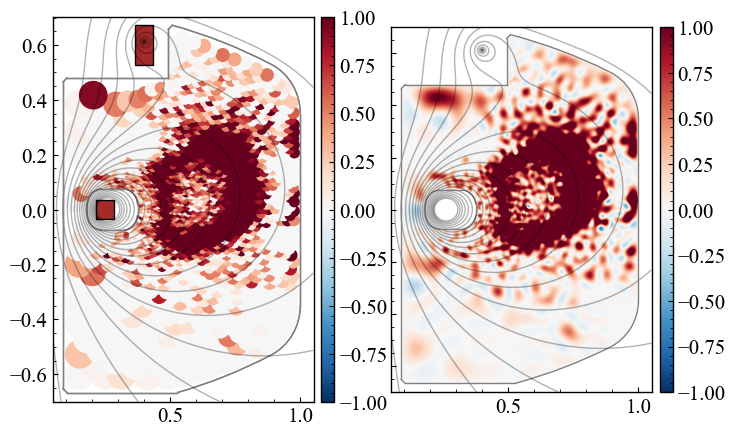

Text(0.5, 1.0, 'Z0 is 0.0 [m]')

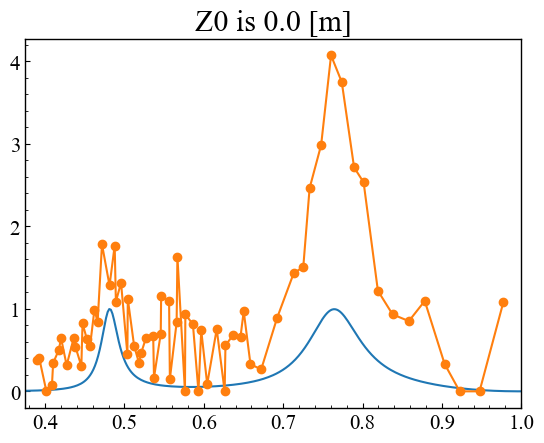

In [20]:
f_art = f

fig0,ax=plt_subplots(1,2,figsize=(8,5),sharex=True,sharey=True)

RT1_kernel.plot_mosaic(ax[0][0],f_art,size=1,cmap='RdBu_r',vmax=1,vmin=-1)
plt_rt1_flux(RT1_kernel,ax[0][0],linewidths=1)

f_hd,mask,im_kwargs = RT1_kernel.convert_grid(f_art,boundary=0)
imshow_cbar(ax[0][1],f_hd*mask,**im_kwargs,cmap='RdBu_r',vmax=1,vmin=-1)
plt_rt1_flux(RT1_kernel,ax[0][1],linewidths=1)
plt.show()

z0 = 0.
iz = np.argmin(abs(z_plot-z0))
plt.plot(r_plot,f_ring2_HD[iz,:])
around_z0 = (zI < z0+0.01)*(zI > z0-0.01)

def sort_r_f(r,f):
    hoge = [(r[i],f[i]) for i in range(r.size)  ]
    hoge.sort()
    r_est0 =[ a[0] for a in hoge ] 
    f_est0 =[ a[1] for a in hoge ] 
    return np.array(r_est0),np.array(f_est0)

r_0,f_art0 =sort_r_f(rI[around_z0],f_art[around_z0]) 

plt.plot(r_0,f_art0,'o-')

plt.xlim(0.375,1)
plt.title('Z0 is '+str(z0)+' [m]')


100
30
10
3
1


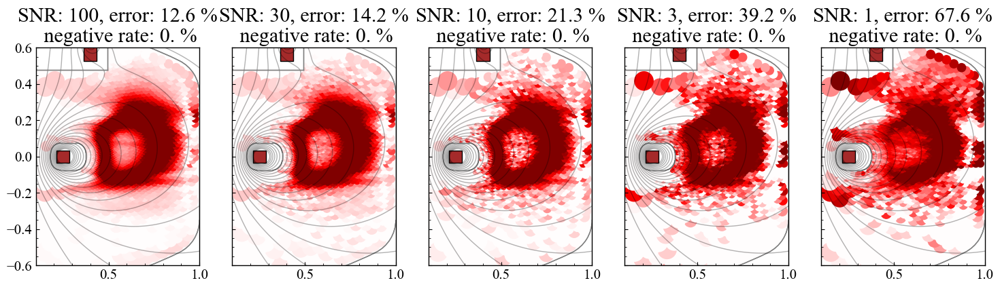

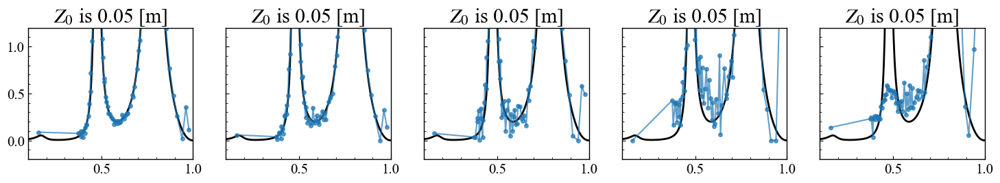

In [21]:
fig0,axs0  =   plt_subplots(1,len(SN_list),figsize=(18,5),sharex=True,sharey=True)
fig1,axs1  = plt_subplots(1,len(SN_list),  figsize=(18,2.5),sharex=True,sharey=True)

fart_dic = {}
for i,SN in enumerate(SN_list):
    f = np.zeros(nI)
    for j in range(1000):
        y = y_dic[SN]
        hoge = H.T @(sigma_md_inv**2*( y.flatten()- sigma_md_inv*(H@f))) -5/SN**2*f

        if j%100 ==0  :
            #print(i, hoge.std())
            pass 
        f+=0.01*hoge

        f[f<0.0] = 0.0
    print(SN)
    f_art = f
    fart_dic[SN] = f_art
    
    z0 = +0.05
    iz = np.argmin(abs(z_plot-z0))
    #plt.plot(r_plot,f_hd[iz,:])
    around_z0 = (zI < z0+0.01)*(zI > z0-0.01)


    r_0,f_est0 =sort_r_f(rI[around_z0],f_art[around_z0]) 

    RT1_kernel.plot_mosaic(axs0[0][i],f_art,back_ground=0,size=1,cmap=common_map,vmax=1,vmin=-1,cbar=False)
    plt_rt1_flux(RT1_kernel,axs0[0][i],linewidths=1)

    axs1[0][i].plot(r_plot,1/g_scale*f_ring2_HD[iz,:],'k-',lw=2,label='ground truth')
    axs1[0][i].plot(r_0,f_est0,'o-',alpha=0.7,ms=4,label='SN:' +str(SN))
    axs0[0][i].set_title('SNR: '+str(SN)+', error: '+str(error*100)[:4])
    
    error = np.sum(abs(f_art-f_true)*Lsq_I)/ np.sum(f_true*Lsq_I)
    #error = np.sqrt(np.sum(abs(f_art-f_true)**2*Lsq_I))/ np.sqrt(np.sum(f_true**2*Lsq_I))
    negative_rate = np.sum(f_art[f_art <0]*Lsq_I[f_art <0])/np.sum(abs(f_art)*Lsq_I)
    axs0[0][i].set_title('SNR: '+str(SN)+', error: '+str(error*100)[:4]+' %'+'\n negative rate: '+'0. %')


    axs0[0][i].set_xlim(0.1,1)
    axs1[0][i].set_ylim(-0.2,1.2)
    axs0[0][i].set_ylim(-0.6,0.6)
    axs1[0][i].set_xlim(0.1,1)
    axs1[0][i].set_title(r'$Z_0$ is '+str(z0)+' [m]')

#legend = ax.legend(fontsize=12,frameon=1)
#frame  = legend.get_frame()
#frame.set_color('white')
#frame.set_edgecolor('none')

In [22]:
model2 = rt1kernel.tomography.GPT_lin(Obs=Obs,Kernel=RT1_kernel)
#K = RT1_kernel.set_kernel(length_scale=1,is_bound=False)

K_f_pri,f_pri = model2.Kernel.set_kernel(length_scale=1.71,is_bound=True,bound_value=0,bound_sig=0.0001,bound_space=3e-3)
model2.set_prior(K=1*K_f_pri,f_pri=f_pri)

sigma = np.ones(200*200)
SN = 10
model2.set_sig(sig_array=1*sigma_masked,g_obs=y_dic[SN])

num of bound point is  1560


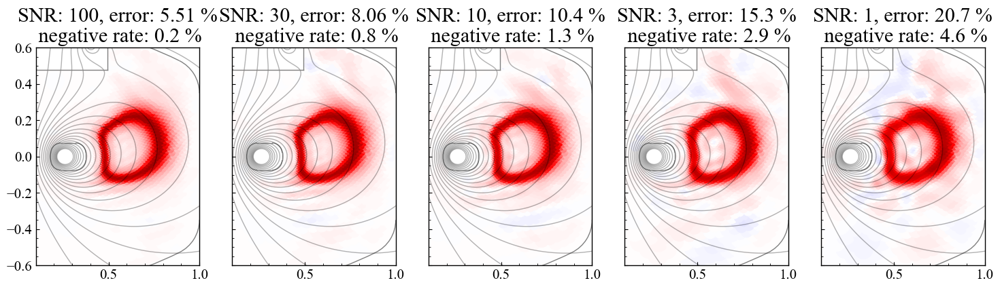

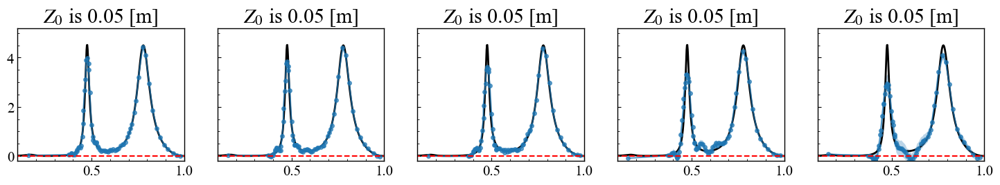

In [23]:
fig0,axs0  =   plt_subplots(1,len(SN_list),figsize=(18,5),sharex=True,sharey=True)
fig1,axs1  = plt_subplots(1,len(SN_list),  figsize=(18,2.5),sharex=True,sharey=True)


for i,SN in enumerate(SN_list):
    model2.set_sig(sig_array=1/SN*sigma_masked,g_obs=y_dic[SN])
    f,Kf_pos=model2.calc_core()
    
    z0 = +0.05
    iz = np.argmin(abs(z_plot-z0))
    #plt.plot(r_plot,f_hd[iz,:])
    around_z0 = (zI < z0+0.01)*(zI > z0-0.01)

    sigf = np.sqrt(np.diag(Kf_pos))
    r_0,f_est0 =sort_r_f(rI[around_z0],f[around_z0]) 
    r_0,sig_est0 =sort_r_f(rI[around_z0],sigf[around_z0]) 

    model2.Kernel.plot_mosaic(ax=axs0[0][i],f=f,back_ground=0,vmax=5,vmin=-5,cmap=common_map,cbar=False,is_frame=False)
    plt_rt1_flux(model2.Kernel,axs0[0][i],linewidths=1)
    sig_est0[0] = 0
    axs1[0][i].plot(r_plot,1/g_scale*f_ring2_HD[iz,:],'k-',lw=2,label='ground truth')
    axs1[0][i].plot(r_0,f_est0,'o-',alpha=0.7,ms=4,label='SN:' +str(SN))
    axs1[0][i].fill_between(r_0,f_est0+sig_est0,f_est0-sig_est0,alpha=0.3)

    error = np.sum(abs(f-f_true)*Lsq_I) / np.sum(f_true*Lsq_I)
    error = np.sqrt(np.sum(abs(f-f_true)**2*Lsq_I)) / np.sqrt(np.sum(f_true**2*Lsq_I))
    
    negative_rate = np.sum(f[f <0]*Lsq_I[f <0])/np.sum(abs(f)*Lsq_I)
    axs0[0][i].set_title('SNR: '+str(SN)+', error: '+str(error*100)[:4]+' %'+'\n negative rate: '+str(-negative_rate*100)[:3]+' %')


    axs0[0][i].set_xlim(0.1,1)
    axs1[0][i].set_xlim(0.1,1)
    axs0[0][i].set_ylim(-0.6,0.6)
    axs1[0][i].set_ylim(-0.2,5.2)
    axs1[0][i].hlines(0,0,1,linestyles='dashed',colors='r')

    axs1[0][i].set_title(r'$Z_0$ is '+str(z0)+' [m]')


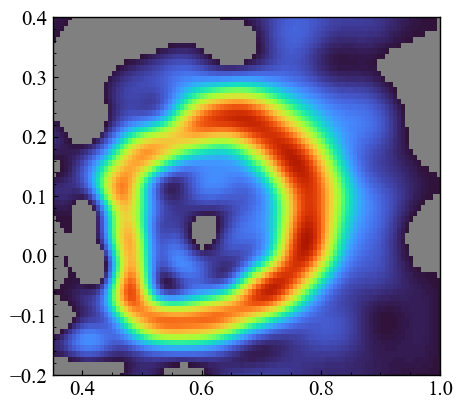

In [24]:

fig,ax = plt.subplots(figsize=(5,6))

F,mask,imkwargs = RT1_kernel.convert_grid_media(f*g_scale,boundary=0)


F[F<0] = np.nan

Negative = np.ones_like(F)

Negative[~np.isnan(F)] = np.nan


ax.imshow(F*mask,**imkwargs,cmap='turbo',vmax=1,vmin=0)

ax.imshow(Negative,**imkwargs,cmap='gray',alpha=0.5)
ax.set_ylim(-0.2,0.4)
ax.set_xlim(0.35,1.0)

fig.savefig('figures\\hollow_linGP_SNR1.svg')


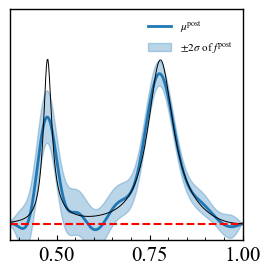

In [25]:


fig,ax = plt.subplots(figsize=(3,3))    


# y軸を表示しない
ax.set_xlim(0.375,1)
ax.set_ylim(-0.1,1.3)
ax.yaxis.set_visible(False)


f_HD,mask,im_kwargs = RT1_kernel.convert_grid(f,boundary=0)


cycle = plt.get_cmap('tab10')
ax.plot(r_plot,f_HD[iz,:]*g_scale,'-',color=cycle(0),lw=2,label=r'$\mu^\mathrm{post}$')

sigf_HD,mask,im_kwargs = RT1_kernel.convert_grid(sigf,boundary=-0)
cycle = plt.get_cmap('tab10')
#ax.plot(r_plot,np.exp(f_HD[iz,:]+sigf_HD[iz,:])*g_scale,'--',color=cycle(0),lw=1,label='$\pm1\sigma$ of $f^\mathrm{pos}$')
#ax.plot(r_plot,np.exp(f_HD[iz,:]-sigf_HD[iz,:])*g_scale,'--',color=cycle(0),lw=1)

ax.fill_between(r_plot,(f_HD[iz,:]+2*sigf_HD[iz,:])*g_scale,(f_HD[iz,:]-2*sigf_HD[iz,:])*g_scale,alpha=0.3,color=cycle(0),label='$\pm2\sigma$ of $f^\mathrm{post}$')

ax.legend(loc='upper right',fontsize=8,frameon=False)
ax.plot(r_plot,f_ring2_HD[iz,:],'k-',lw=0.7,label='true line' )

ax.hlines(0., 0.375,1.0,linestyles='dashed',colors='r')



fig.savefig('figures\\hollow_linGP_SNR1_on_eq.svg')

In [ ]:
Obs = rt1kernel.Observation_Matrix_integral_load_model(path='example/rt1tomography/model.json')
Obs.set_directon()

Obs.set_mask()

Obs.set_Hsum(nmax_ref=0)



In [64]:
model2 = rt1kernel.tomography.GPT_log(Obs=Obs,Kernel=RT1_kernel)
#K = RT1_kernel.set_kernel(length_scale=1,is_bound=False)
K_f,f_pri = RT1_kernel.set_kernel(length_scale=1.71,is_bound=True,bound_value=-5,bound_sig=0.01,bound_space=3e-3,mean=-3)
model2.set_kernel(K=K_f,f_pri=f_pri)

sigma = np.ones(200*200)
SN = 10
model2.set_sig(sig_im=sigma_masked,g_obs=y_dic[SN])

num of bound point is  1560


In [65]:
f_log=[]
f=0
does_continue = False
i = 0

0 6609.362908031908


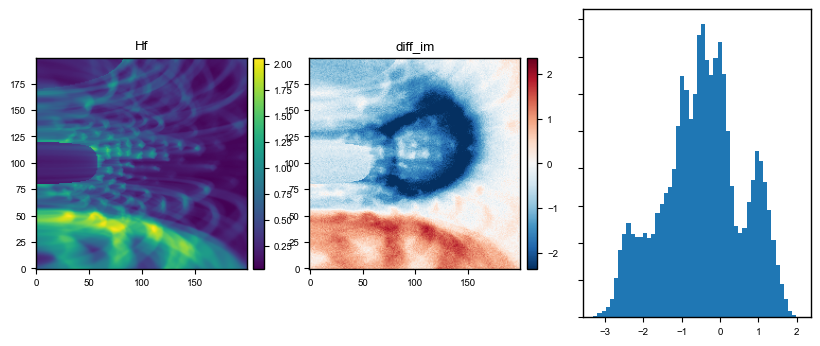

1 388885.3621718495
2 1134023.6827179897
3 527003.4617241515
4 112688.65661467728
5 3768.369181243728
6 1847.7549196184625
7 802.4980343091411
8 305.61860295767445
9 129.2141704347101
10 69.08468183004445


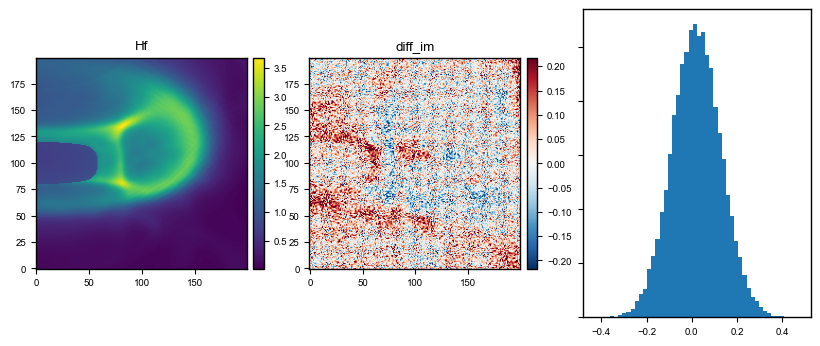

11 30.34121163518346
12 19.862895929413035
13 8.513348423832316
14 6.6082542106957565
15 2.3102901379580305
16 1.236220667661815
17 0.30442375877276917
18 0.07476379618905356
19 0.0037730270024777103
20 5.911271551043683e-05


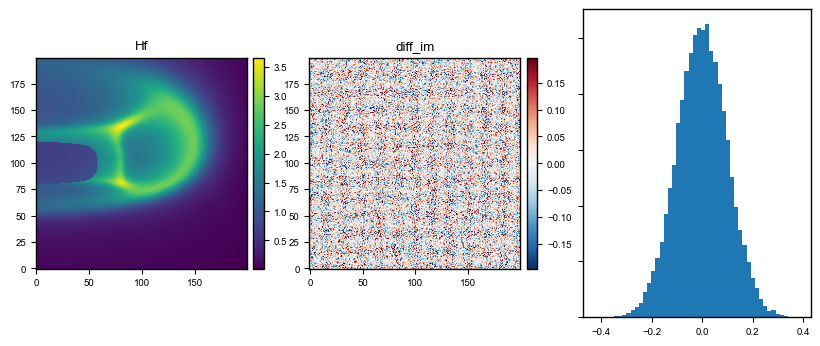

21 8.297281226378887e-09


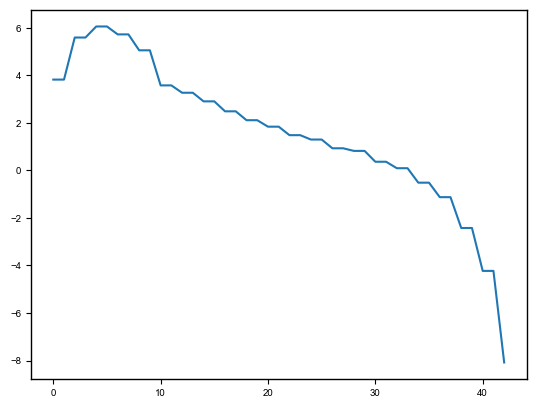

In [66]:
if not does_continue:
    # = np.log(f_ring2)
    f = -2*np.ones(nI)
    #a = a_sol.copy()
    f_log= []
    
model2.sig_scale =  1/SN

for _ in range(100):
    delta_f,loss = model2.calc_core_fast(f)
    f_log.append(loss)
    if loss >= 1e-5:
        print(i,loss)
    else:
        print(i,loss)
        break 
    
    lr = 1
    f += lr*delta_f
    f_log.append(loss)
    if i%10 == 0:
        model2.check_diff(f) 
        pass  
    i += 1

plt.plot(np.log10(f_log))
plt.show()
model2.postprocess(f)
does_continue = True

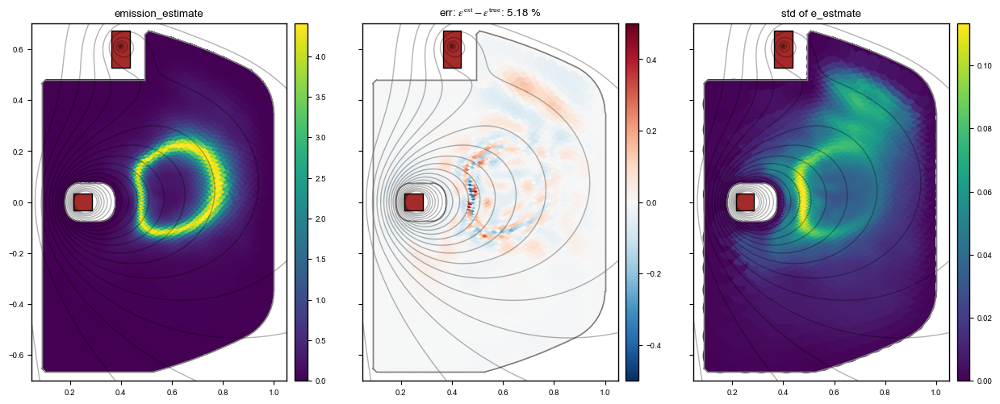

In [67]:
fig0,axs0 =plt_subplots(1,3,figsize=(15,6),sharey=True)
axs0 = axs0[0][:]

Lsq_I = RT1_kernel.Lsq_I

RT1_kernel.plot_mosaic(axs0[0],np.exp(f),size=1.1,back_ground=0,vmin=0)
RT1_kernel.plot_mosaic(axs0[1],np.exp(f)-f_true,size=1.1,back_ground=0,cmap='RdBu_r',vmax=0.5,vmin=-0.5)
RT1_kernel.plot_mosaic(axs0[2],np.exp(f)*model2.sigf_pos,size=1.5,back_ground=0,vmin=0)

plt_rt1_flux(RT1_kernel,axs0[0],linewidths=1)
plt_rt1_flux(RT1_kernel,axs0[1],linewidths=1)
plt_rt1_flux(RT1_kernel,axs0[2],linewidths=1)

axs0[0].set_title('emission_estimate')
error = np.sum(abs(np.exp(f)-f_true)*Lsq_I) / np.sum(np.exp(f)*Lsq_I)
axs0[1].set_title(r'err: $\varepsilon^{\mathrm{est}} - \varepsilon^{\mathrm{true}}$: '+str(error*100)[:4]+' %')
axs0[2].set_title('std of e_estmate')

plt.show()


29 3.922939890403231e-08
100 0.023187362861592647 -0.046040870932023
27 7.880470883812841e-10
30 0.03384950139985097 -0.046040870932023
21 8.297281226378887e-09
10 0.05177829210649324 -0.046040870932023
20 1.1915069535701752e-07
3 0.08270760013899894 -0.046040870932023
17 3.6133497419844824e-06
1 0.12746315313006917 -0.046040870932023


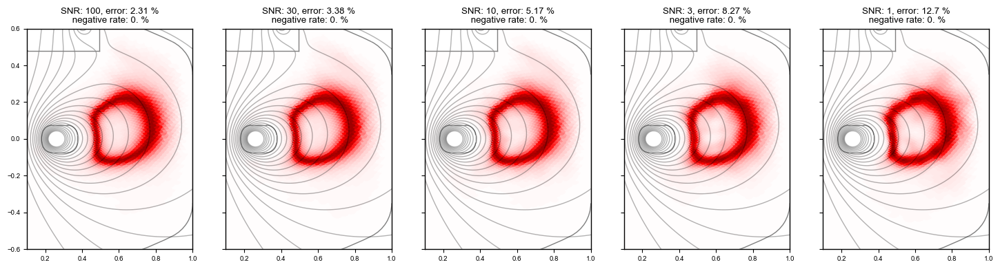

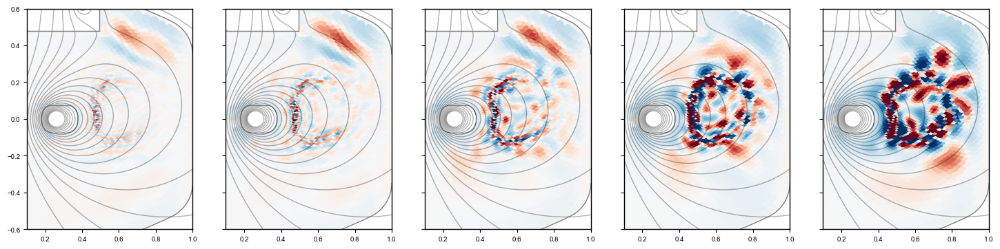

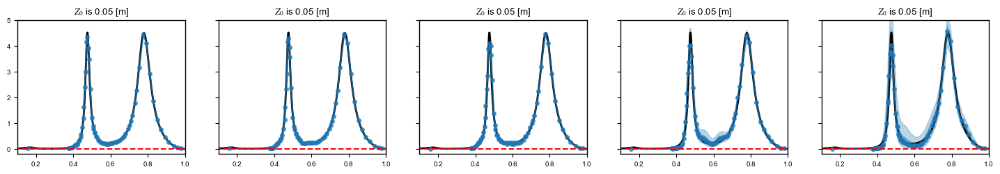

In [68]:
fig0,axs0  =   plt_subplots(1,len(SN_list),figsize=(18,5),sharex=True,sharey=True)
fig2,axs2  = plt_subplots(1,len(SN_list),  figsize=(18,5),sharex=True,sharey=True)
fig1,axs1  = plt_subplots(1,len(SN_list),  figsize=(18,2.5),sharex=True,sharey=True)


for i,SN in enumerate(SN_list):
    model2.set_sig(sig_im=sigma_masked,g_obs=y_dic[SN])
    f = -2*np.ones(nI)    
    model2.sig_scale = 1/SN
    j = 0
    for _ in range(100):
        delta_f,loss = model2.calc_core_fast(f)
        f_log.append(loss)
        if loss >= 1e-5:
            pass
            #print(j,loss)
        else:
            print(j,loss)
            break         
        lr = 1
        f += lr*delta_f
        j += 1

    model2.postprocess(f)
    sigf = model2.sigf_pos
    z0 = +0.05
    iz = np.argmin(abs(z_plot-z0))
    #plt.plot(r_plot,f_hd[iz,:])
    around_z0 = (zI < z0+0.01)*(zI > z0-0.01)

    #sigf = np.sqrt(np.diag(Kf_pos))
    r_0,f_est0 =sort_r_f(rI[around_z0],f[around_z0]) 
    r_0,sig_est0 =sort_r_f(rI[around_z0],sigf[around_z0]) 

    model2.Kernel.plot_mosaic(ax=axs0[0][i],f=np.exp(f),back_ground=0,vmax=5,vmin=-5,cmap=common_map,cbar=False,is_frame=False)
    plt_rt1_flux(model2.Kernel,axs0[0][i],linewidths=1)

    axs1[0][i].plot(r_plot,1/g_scale*f_ring2_HD[iz,:],'k-',lw=2,label='ground truth')
    axs1[0][i].plot(r_0,np.exp(f_est0),'o-',alpha=0.7,ms=4,label='SN:' +str(SN))
    axs1[0][i].fill_between(r_0,np.exp(f_est0+sig_est0),np.exp(f_est0-sig_est0),alpha=0.5)
    axs1[0][i].fill_between(r_0,np.exp(f_est0+2*sig_est0),np.exp(f_est0-2*sig_est0),alpha=0.3,color=cycle(0))

    error = np.sqrt(np.sum(abs(np.exp(f)-f_true)**2*Lsq_I)) / np.sqrt(np.sum(f_true**2*Lsq_I))
    error = np.sum(abs(np.exp(f)-f_true)*Lsq_I) / np.sum(f_true*Lsq_I)
    
    axs0[0][i].set_title('SNR: '+str(SN)+', error: '+str(error*100)[:4]+' %'+'\n negative rate: '+'0. %')

    
    model2.Kernel.plot_mosaic(ax=axs2[0][i],f=(np.exp(f)-f_true),back_ground=0,vmax=0.2,vmin=-0.2,cmap='RdBu_r',cbar=False,is_frame=False)
    plt_rt1_flux(model2.Kernel,axs2[0][i],linewidths=1)

    print(SN,error,negative_rate)

    axs0[0][i].set_xlim(0.1,1)
    axs2[0][i].set_xlim(0.1,1)
    axs1[0][i].set_xlim(0.1,1)
    axs0[0][i].set_ylim(-0.6,0.6)
    axs2[0][i].set_ylim(-0.6,0.6)

    axs1[0][i].hlines(0,0,1,linestyles='dashed',colors='r')

    axs1[0][i].set_ylim(-0.2,5)
    axs1[0][i].set_title(r'$Z_0$ is '+str(z0)+' [m]')


In [63]:

params = {
        'font.family'      : 'Arial', # font familyの設定
        'mathtext.fontset' : 'stix'           , # math fontの設定
        "font.size"        : 8               , # 全体のフォントサイズが変更されます。
        'xtick.labelsize'  : 7               , # 軸だけ変更されます。
        'ytick.labelsize'  : 7               , # 軸だけ変更されます
        'xtick.minor.visible' :False,
        'ytick.minor.visible' :False,
        'xtick.direction'  : 'out'             , # x axis in
        'ytick.direction'  : 'out'             , # y axis in 
        'axes.linewidth'   : 1.0              , # axis line width
        'axes.grid'        : False             , # make grid
        'figure.facecolor' : 'none',#透明にする.
        }

for key in params.keys():
    print(key, " : ",params[key])

plt.rcParams.update(**params)

font.family  :  Arial
mathtext.fontset  :  stix
font.size  :  8
xtick.labelsize  :  7
ytick.labelsize  :  7
xtick.minor.visible  :  False
ytick.minor.visible  :  False
xtick.direction  :  out
ytick.direction  :  out
axes.linewidth  :  1.0
axes.grid  :  False
figure.facecolor  :  none


In [33]:
SN =1 
model2.set_sig(sig_im=sigma_masked,g_obs=y_dic[SN])
f = -2*np.ones(nI)    
model2.sig_scale = 1/SN
j = 0
for _ in range(100):
    delta_f,loss = model2.calc_core_fast(f)
    f_log.append(loss)
    if loss >= 1e-5:
        pass
        #print(j,loss)
    else:
        print(j,loss)
        break         
    lr = 1
    f += lr*delta_f
    j += 1

model2.postprocess(f)
sigf = model2.sigf_pos
z0 = +0.05
iz = np.argmin(abs(z_plot-z0))
#plt.plot(r_plot,f_hd[iz,:])
around_z0 = (zI < z0+0.01)*(zI > z0-0.01)

#sigf = np.sqrt(np.diag(Kf_pos))
r_0,f_est0 =sort_r_f(rI[around_z0],f[around_z0]) 
r_0,sig_est0 =sort_r_f(rI[around_z0],sigf[around_z0]) 




17 3.6133497419844824e-06


In [34]:
f_true.max()*g_scale

0.9999404048912178

(0.35, 1.0)

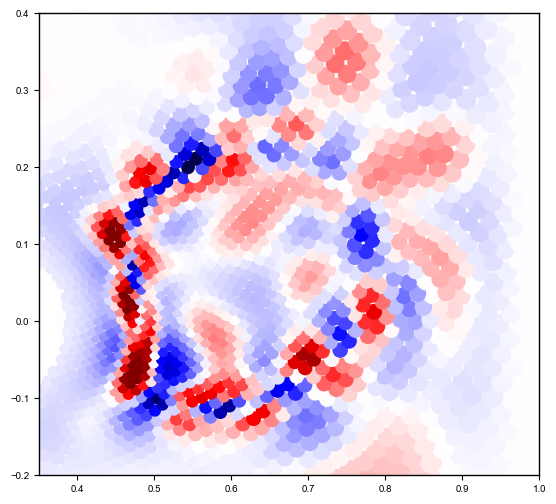

In [35]:


fig0,axs0 =plt.subplots(1,1,figsize=(15,6),sharey=True)

model2.Kernel.plot_mosaic(ax=axs0,f=(np.exp(f)-f_true)*g_scale,size=2,back_ground=0,vmax=0.2,vmin=-0.2,cmap='seismic',cbar=False,is_frame=False)
plt.ylim(-0.2,0.4)


plt.xlim(0.35,1.0)

In [36]:

params = {
        'font.family'      : 'Arial', # font familyの設定
        'mathtext.fontset' : 'stix'           , # math fontの設定
        "font.size"        : 8               , # 全体のフォントサイズが変更されます。
        'xtick.labelsize'  : 7               , # 軸だけ変更されます。
        'ytick.labelsize'  : 7               , # 軸だけ変更されます
        'xtick.minor.visible' :False,
        'ytick.minor.visible' :False,
        'xtick.direction'  : 'out'             , # x axis in
        'ytick.direction'  : 'out'             , # y axis in 
        'axes.linewidth'   : 0.5              , # axis line width
        'axes.grid'        : False             , # make grid
        'figure.facecolor' : 'none',#透明にする.
        }

for key in params.keys():
    print(key, " : ",params[key])

plt.rcParams.update(**params)

font.family  :  Arial
mathtext.fontset  :  stix
font.size  :  8
xtick.labelsize  :  7
ytick.labelsize  :  7
xtick.minor.visible  :  False
ytick.minor.visible  :  False
xtick.direction  :  out
ytick.direction  :  out
axes.linewidth  :  0.5
axes.grid  :  False
figure.facecolor  :  none


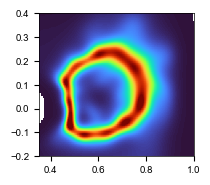

In [37]:


fig,ax = plt.subplots(figsize=(2,3))

F,mask,imkwargs = RT1_kernel.convert_grid_media(np.exp(f)*g_scale,boundary=0)


ax.imshow(F*mask,**imkwargs,cmap='turbo',vmax=1,vmin=0)
ax.set_ylim(-0.2,0.4)
ax.set_xlim(0.35,1.0)

fig.savefig('figures\\hollow_logGP_SNR1.svg')


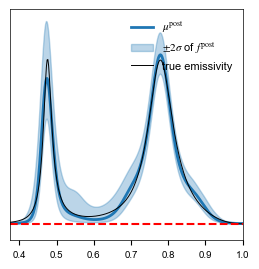

In [123]:


fig,ax = plt.subplots(figsize=(3,3))    


# y軸を表示しない
ax.set_xlim(0.375,1)
ax.set_ylim(-0.1,1.3)
ax.yaxis.set_visible(False)

f_HD,mask,im_kwargs = RT1_kernel.convert_grid(f,boundary=-5)


cycle = plt.get_cmap('tab10')
ax.plot(r_plot,np.exp(f_HD[iz,:])*g_scale,'-',color=cycle(0),lw=2,label=r'$\mu^\mathrm{post}$')

sigf_HD,mask,im_kwargs = RT1_kernel.convert_grid(sigf,boundary=-0)
cycle = plt.get_cmap('tab10')
#ax.plot(r_plot,np.exp(f_HD[iz,:]+sigf_HD[iz,:])*g_scale,'--',color=cycle(0),lw=1,label='$\pm1\sigma$ of $f^\mathrm{pos}$')
#ax.plot(r_plot,np.exp(f_HD[iz,:]-sigf_HD[iz,:])*g_scale,'--',color=cycle(0),lw=1)

ax.fill_between(r_plot,np.exp(f_HD[iz,:]+2*sigf_HD[iz,:])*g_scale,np.exp(f_HD[iz,:]-2*sigf_HD[iz,:])*g_scale,alpha=0.3,color=cycle(0),label='$\pm2\sigma$ of $f^\mathrm{post}$')

ax.plot(r_plot,f_ring2_HD[iz,:],'k-',lw=0.7,label='true emissivity' )
ax.legend(loc='upper right',fontsize=8,frameon=False)

ax.hlines(0., 0.375,1.0,linestyles='dashed',colors='r')



fig.savefig('figures\\hollow_linGP_SNR1_on_eq.svg')

(0.3, 1.0)

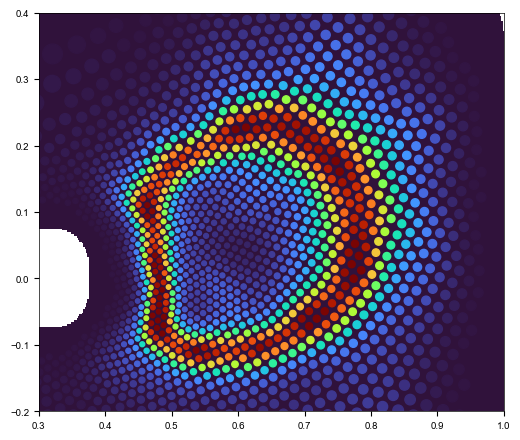

In [115]:



fig,ax = plt.subplots(figsize=(6,6))

model2.Kernel.plot_mosaic(ax=ax,f=np.exp(f)*g_scale,back_ground=0,vmin=0,cmap='turbo',cbar=False,is_frame=False)


ax.set_ylim(-0.2,0.4)


ax.set_xlim(0.3,1.0)

In [41]:


def make_alpha_colormap(color):
    from matplotlib.colors import LinearSegmentedColormap
    c = plt.cm.colors.to_rgba(color)
    cmap_dict = {
        'red':   [[0, c[0], c[0]], [1, c[0], c[0]]],
        'green': [[0, c[1], c[1]], [1, c[1], c[1]]],
        'blue':  [[0, c[2], c[2]], [1, c[2], c[2]]],
        'alpha': [[0, 0, 0], [1, 1, 1]]  # アルファ値は0から1まで線形に変化
    }
    return LinearSegmentedColormap('CustomMap', cmap_dict)


import mpl_toolkits.axes_grid1


def axs_cbar(
    ax:plt.Axes,
    im,
    cbar_title =None,
    **kwargs
    ):

    divider = mpl_toolkits.axes_grid1.make_axes_locatable(ax)    
    cax = divider.append_axes("right", size="5%", pad='3%')
    cbar = plt.colorbar(im, cax=cax, orientation='vertical',label=cbar_title)

def plotGP(
        x_inp,f_inp,K_inp,
        ax:plt.Axes = None,
        color = 'darkblue',alpha_max=1,n_sample=0,cbar_title='',**sample_kwargs):

    if ax is None:
        ax = plt.gca()

    import scipy.interpolate

    func = scipy.interpolate.interp1d(x_inp,f_inp)
    nx = 500
    ny = 500

    x_min,x_max = ax.get_xlim()
    y_min,y_max = ax.get_ylim()

    x_plot = np.linspace(x_min,x_max,nx)    
    y_plot = np.linspace(y_min,y_max,ny)

    F = func(x_plot)[np.newaxis,:]
    sig = np.sqrt(np.diag(K_inp))
    func = scipy.interpolate.interp1d(x_inp,sig)

    Sig = func(x_plot)[np.newaxis,:]

    X,Y = np.meshgrid(x_plot,y_plot)

    # このカラーマップを使用
    alpha_cmap = make_alpha_colormap(color)

    C =  1/Sig * np.exp(-0.5*(F-Y)**2/Sig**2)
    C =  C/ C.max() * alpha_max


    dx = x_plot[1]-x_plot[0]
    dy = y_plot[1]-y_plot[0]

    extent = (x_plot.min()-0.5*dx,x_plot.max()+0.5*dx, y_plot.min()-0.5*dy, y_plot.max() + 0.5*dy)
    im = ax.imshow(C, vmin=0, vmax=1,extent=extent, cmap= alpha_cmap,origin='lower' ,aspect='auto',zorder=0)

    
    divider = mpl_toolkits.axes_grid1.make_axes_locatable(ax)    
    cax = divider.append_axes("right", size="3%", pad='3%')
    cbar = plt.colorbar(im, cax=cax, orientation='vertical',label=cbar_title)
    #clabelのフォントサイズを変更

    # n=0 のとき、標本路をプロットしない。
    if n_sample > 0:
        f_sample = np.random.multivariate_normal(f_inp,K_inp,n_sample)
        for i in range(n_sample):
            if i == 0:
                
                ax.plot(x_inp,f_sample[i,:], color=color,alpha=0.5,lw=0.3,label='sample path')
            else:
                ax.plot(x_inp,f_sample[i,:], color=color,alpha=0.5,lw=0.3)
    
    ax.plot(x_inp,f_inp+sig,color=color,linestyle='dashed',lw=1.,label=r'$\pm 1\sigma$')
    ax.plot(x_inp,f_inp-sig,color=color,linestyle='dashed',lw=1.)
    


def plotLogGP(
        x_inp,f_inp,K_inp,
        ax:plt.Axes = None,
        color = 'darkblue',alpha_max=1,n_sample=0,**sample_kwargs):
    import scipy.interpolate
    
    if ax is None:
        ax = plt.gca() # get current axis


    func = scipy.interpolate.interp1d(x_inp,f_inp)
    nx = 500
    ny = 500

    x_min,x_max = ax.get_xlim()
    y_min,y_max = ax.get_ylim()
    x_plot = np.linspace(x_min,x_max,nx)    
    y_plot = np.linspace(y_min,y_max,ny)


    F = func(x_plot)[np.newaxis,:]
    sig = np.sqrt(np.diag(K_inp))
    func = scipy.interpolate.interp1d(x_inp,sig)

    Sig = func(x_plot)[np.newaxis,:]
    
    y_plot[y_plot<0] = np.nan
    X,log_Y = np.meshgrid(x_plot,np.log(y_plot))

    # このカラーマップを使用
    alpha_cmap = make_alpha_colormap(color)

    C =  1/Sig * np.exp(-0.5*(F-log_Y)**2/Sig**2)
    C =  C/ C.max() * alpha_max


    dx = x_plot[1]-x_plot[0]
    dy = y_plot[1]-y_plot[0]
    #print(dy)

    extent = (x_plot.min()-0.5*dx,x_plot.max()+0.5*dx, y_plot.min()-0.5*dy, y_plot.max() + 0.5*dy)
    #print(extent)
    im = ax.imshow(C, vmin=0, vmax=1,extent=extent, cmap= alpha_cmap,origin='lower' ,aspect='auto',zorder=0)
    
    divider = mpl_toolkits.axes_grid1.make_axes_locatable(ax)    
    cax = divider.append_axes("right", size="3%", pad='3%')
    cbar = plt.colorbar(im, cax=cax, orientation='vertical')


    # n=0 のとき、標本路をプロットしない。
    if n_sample > 0:
        f_sample = np.random.multivariate_normal(f_inp,K_inp,n_sample)
        for i in range(n_sample):
            if i == 0:
                
                ax.plot(x_inp,np.exp(f_sample[i]), color=color,alpha=0.5,lw=0.3,label='sample path')
            else:
                ax.plot(x_inp,np.exp(f_sample[i]), color=color,alpha=0.5,lw=0.3)
    
    ax.plot(x_inp,np.exp(f_inp+sig),color=color,linestyle='dashed',lw=1.,label=r'$\pm 1\sigma$')
    ax.plot(x_inp,np.exp(f_inp-sig),color=color,linestyle='dashed',lw=1.)
    #plt.xlim(x_plot.min(),x_plot.max())
    #plt.ylim(y_plot.min(),y_plot.max())

In [79]:
r_plot2 = np.linspace(0.375,1,200)

z0 = 0.0
iz = np.argmin(abs(z_plot-z0))
lm = RT1_kernel.length_scale(r_plot2, z0*np.ones(r_plot2.size))
lI = RT1_kernel.length_scale(RT1_kernel.rIb, RT1_kernel.zIb)
lm = np.nan_to_num(lm,nan=1)

K = rt1kernel.GibbsKer(x0= r_plot2, y0 = z0*np.ones(r_plot2.size),x1=RT1_kernel.rIb, y1=RT1_kernel.zIb, lx0=lm,lx1=lI,isotropy=True)

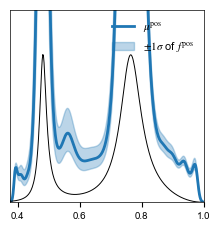

In [80]:


fig,ax = plt.subplots(figsize=(2.5,2.5))    


# y軸を表示しない
ax.set_xlim(0.375,1)
ax.set_ylim(0.,1.3)
ax.yaxis.set_visible(False)


f_HD,mask,im_kwargs = RT1_kernel.convert_grid(f,boundary=-5)


cycle = plt.get_cmap('tab10')
ax.plot(r_plot,np.exp(f_HD[iz,:])*g_scale,'-',color=cycle(0),lw=2,label=r'$\mu^\mathrm{pos}$')

sigf_HD,mask,im_kwargs = RT1_kernel.convert_grid(sigf,boundary=-0)
cycle = plt.get_cmap('tab10')
#ax.plot(r_plot,np.exp(f_HD[iz,:]+sigf_HD[iz,:])*g_scale,'--',color=cycle(0),lw=1,label='$\pm1\sigma$ of $f^\mathrm{pos}$')
#ax.plot(r_plot,np.exp(f_HD[iz,:]-sigf_HD[iz,:])*g_scale,'--',color=cycle(0),lw=1)

ax.fill_between(r_plot,np.exp(f_HD[iz,:]+sigf_HD[iz,:])*g_scale,np.exp(f_HD[iz,:]-sigf_HD[iz,:])*g_scale,alpha=0.3,color=cycle(0),label='$\pm1\sigma$ of $f^\mathrm{pos}$')

ax.legend(loc='upper right',fontsize=8,frameon=False)
ax.plot(r_plot,f_ring2_HD[iz,:],'k-',lw=0.7,label='true line' )



fig.savefig('figures\\logGP_SNR1_on_eq.svg')

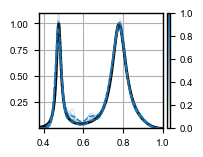

In [169]:
y = np.zeros(RT1_kernel.nI+RT1_kernel.nb)

mue_pos = f 
Ke_pos = model2.Kf_pos
fig,ax = plt.subplots(figsize=(1.7,1.5))

ax.plot(r_plot,f_ring2_HD[iz,:],'k-',lw=2,label='ground truth' )
y[:] = -5+np.log(g_scale  )
y[:RT1_kernel.nI] = mue_pos+np.log(g_scale  )
y2 = K[:,:] @ RT1_kernel.KII_inv[:,:] @ y
K2 = K[:,:] @ RT1_kernel.KII_inv[:,:nI] @ Ke_pos @ RT1_kernel.KII_inv[:nI,:] @ K[:nI,:].T
ax.set_xlim(0.375,1)
ax.set_ylim(0.001,1.1)

cycle = plt.get_cmap('tab10')
plotLogGP(x_inp=r_plot2,f_inp=y2,K_inp=K2,ax=ax,color=cycle(0),alpha_max=1.,n_sample=10)

ax.set_ylim(0.001,1.1)

ax.grid()

fig.savefig('figures\\logGP_SNR3_on_eq.svg')